#3.1 Data Process

Describe the process and steps of collecting raw datasets as well as preparing training, validation  and test datasets for data analytics and machine learning.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# pip install transformers torch

In [ ]:
import os
import json
import pandas as pd
import numpy as np
import torch
import torch.nn as nn

import cv2
import torch
from torch.utils.data import DataLoader, Dataset
from transformers import AutoTokenizer, AutoModel
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

In [ ]:
import json

# Load the uploaded JSON file
with open('/content/drive/Shareddrives/DATA 298A Team 8/youcook/annotations/youcookii_annotations_trainval.json', 'r') as f:
    annotations = json.load(f)

In [ ]:
# Display the top-level structure of the annotations dictionary
print(annotations.keys())

# Display a sample from the annotations to understand its structure
sample_key = list(annotations.keys())[0]  # Get the first key
print(annotations[sample_key])

if 'database' in annotations:
    for video_id, details in list(annotations['database'].items())[:3]:
        print(f"Video ID: {video_id}")
        print("Details:", details)  # Print all details to see available keys
else:
    print("'database' key not found in annotations.")

dict_keys(['database'])
{'GLd3aX16zBg': {'duration': 241.62, 'subset': 'training', 'recipe_type': '113', 'annotations': [{'segment': [90, 102], 'id': 0, 'sentence': 'spread margarine on two slices of white bread'}, {'segment': [114, 127], 'id': 1, 'sentence': 'place a slice of cheese on the bread'}, {'segment': [132, 138], 'id': 2, 'sentence': 'place the bread slices on top of each other and place in a hot pan'}, {'segment': [139, 145], 'id': 3, 'sentence': 'flip the sandwich over and press down'}, {'segment': [173, 174], 'id': 4, 'sentence': 'cut the sandwich in half diagonally'}], 'video_url': 'https://www.youtube.com/watch?v=GLd3aX16zBg'}, 'xHr8X2Wpmno': {'duration': 206.86, 'subset': 'validation', 'recipe_type': '226', 'annotations': [{'segment': [47, 60], 'id': 0, 'sentence': 'pick the ends off the verdalago'}, {'segment': [67, 89], 'id': 1, 'sentence': 'combine lemon juice sumac garlic salt and oil in a bowl'}, {'segment': [91, 98], 'id': 2, 'sentence': 'chop lettuce and place it

#3.2 Data Collection

Describe the sources, parameters and quantity of raw datasets; collect sufficient raw datasets;  present samples from raw datasets.

In [ ]:
# Count the number of videos
if 'database' in annotations:
    num_videos = len(annotations['database'])
    print(f"Total number of videos: {num_videos}")
else:
    print("'database' key not found in annotations.")

Total number of videos: 1790


In [ ]:
# Define a subset of video IDs to sample from the dataset
sample_video_ids = list(annotations['database'].keys())[:5]  # Adjust the number as needed

# Iterate over each video ID in the sample
for video_id in sample_video_ids:
    video_info = annotations['database'][video_id]

    annotations_info = video_info.get('annotations', 'Not available')

    print(f"Video ID: {video_id}")
    print(f"Annotations: {annotations_info}\n")

Video ID: GLd3aX16zBg
Annotations: [{'segment': [90, 102], 'id': 0, 'sentence': 'spread margarine on two slices of white bread'}, {'segment': [114, 127], 'id': 1, 'sentence': 'place a slice of cheese on the bread'}, {'segment': [132, 138], 'id': 2, 'sentence': 'place the bread slices on top of each other and place in a hot pan'}, {'segment': [139, 145], 'id': 3, 'sentence': 'flip the sandwich over and press down'}, {'segment': [173, 174], 'id': 4, 'sentence': 'cut the sandwich in half diagonally'}]

Video ID: xHr8X2Wpmno
Annotations: [{'segment': [47, 60], 'id': 0, 'sentence': 'pick the ends off the verdalago'}, {'segment': [67, 89], 'id': 1, 'sentence': 'combine lemon juice sumac garlic salt and oil in a bowl'}, {'segment': [91, 98], 'id': 2, 'sentence': 'chop lettuce and place it in a bowl'}, {'segment': [99, 137], 'id': 3, 'sentence': 'add verdalago pepper cucumbers tomatoes herbs and onions to the lettuce in the bowl'}, {'segment': [153, 162], 'id': 4, 'sentence': 'pour the dressin

##Download the video to drive

In [ ]:
# !pip install yt-dlp

In [ ]:
# # Video downloading logic using yt-dlp without a file size limit
# import os
# import json
# import yt_dlp
# import pandas as pd
# import numpy as np
# import cv2
# import torch
# from torch.utils.data import DataLoader, Dataset
# from transformers import AutoTokenizer, AutoModel
# from sklearn.model_selection import train_test_split
# import matplotlib.pyplot as plt

# # Load the JSON file with annotations
# with open('youcookii_annotations_trainval.json', 'r') as f:
#     annotations = json.load(f)

# # Display the top-level structure of the annotations dictionary
# print(annotations.keys())

# # Display a sample from the annotations to understand its structure
# sample_key = list(annotations.keys())[0]  # Get the first key
# print(annotations[sample_key])

# # Print a few items from 'database' to inspect the structure if it exists
# if 'database' in annotations:
#     for video_id, details in list(annotations['database'].items())[:3]:
#         print(f"Video ID: {video_id}")
#         print("Details:", details)
# else:
#     print("'database' key not found in annotations.")

# # Define a subset of video IDs to sample from the dataset
# # Just deleated the limited number 5
# sample_video_ids = list(annotations['database'].keys())  # Adjust the number as needed

# # Video download function without file size limit
# def download_video(video_url, output_path):
#     # yt-dlp options without file size limit
#     ydl_opts = {
#         'outtmpl': os.path.join(output_path, '%(id)s.%(ext)s'),
#         'format': 'best',
#     }

#     try:
#         with yt_dlp.YoutubeDL(ydl_opts) as ydl:
#             ydl.download([video_url])
#             print(f"Downloaded: {video_url}")
#     except yt_dlp.utils.DownloadError as e:
#         print(f"Failed to download {video_url}: {e}")

# # Set download path to Google Drive
# output_path = '/content/drive/Shareddrives/DATA 298A Team 8/videos'
# os.makedirs(output_path, exist_ok=True)

In [ ]:
# Inspect a few entries to understand the structure of each video in 'database'
for video_id, details in list(annotations['database'].items())[:3]:
    print(f"Video ID: {video_id}")
    for key, value in details.items():
        print(f"  {key}: {value}")
    print("\n")

Video ID: GLd3aX16zBg
  duration: 241.62
  subset: training
  recipe_type: 113
  annotations: [{'segment': [90, 102], 'id': 0, 'sentence': 'spread margarine on two slices of white bread'}, {'segment': [114, 127], 'id': 1, 'sentence': 'place a slice of cheese on the bread'}, {'segment': [132, 138], 'id': 2, 'sentence': 'place the bread slices on top of each other and place in a hot pan'}, {'segment': [139, 145], 'id': 3, 'sentence': 'flip the sandwich over and press down'}, {'segment': [173, 174], 'id': 4, 'sentence': 'cut the sandwich in half diagonally'}]
  video_url: https://www.youtube.com/watch?v=GLd3aX16zBg


Video ID: xHr8X2Wpmno
  duration: 206.86
  subset: validation
  recipe_type: 226
  annotations: [{'segment': [47, 60], 'id': 0, 'sentence': 'pick the ends off the verdalago'}, {'segment': [67, 89], 'id': 1, 'sentence': 'combine lemon juice sumac garlic salt and oil in a bowl'}, {'segment': [91, 98], 'id': 2, 'sentence': 'chop lettuce and place it in a bowl'}, {'segment': [99,

In [ ]:
!pip install wordcloud


In [ ]:
import json
import os

# Load the annotations JSON file
annotations_path = '/content/drive/Shareddrives/DATA 298A Team 8/youcook/annotations/youcookii_annotations_trainval.json'
with open(annotations_path, 'r') as f:
    annotations = json.load(f)

# Extract and display the recipe descriptions for each video
def display_recipe_annotations(annotations, sample_size=3):
    # Limit to a sample size for display
    video_ids = list(annotations['database'].keys())[:sample_size]

    for video_id in video_ids:
        print(f"\nVideo ID: {video_id}")
        annotation_data = annotations['database'][video_id]['annotations']

        # Display each recipe step with starting and ending times
        for step_num, step in enumerate(annotation_data):
            start_time, end_time = step['segment']
            description = step['sentence']
            print(f"  Step {step_num + 1}: '{description}' (Start: {start_time}s, End: {end_time}s)")

# Run the function to display a sample of structured recipe descriptions
display_recipe_annotations(annotations)



Video ID: GLd3aX16zBg
  Step 1: 'spread margarine on two slices of white bread' (Start: 90s, End: 102s)
  Step 2: 'place a slice of cheese on the bread' (Start: 114s, End: 127s)
  Step 3: 'place the bread slices on top of each other and place in a hot pan' (Start: 132s, End: 138s)
  Step 4: 'flip the sandwich over and press down' (Start: 139s, End: 145s)
  Step 5: 'cut the sandwich in half diagonally' (Start: 173s, End: 174s)

Video ID: xHr8X2Wpmno
  Step 1: 'pick the ends off the verdalago' (Start: 47s, End: 60s)
  Step 2: 'combine lemon juice sumac garlic salt and oil in a bowl' (Start: 67s, End: 89s)
  Step 3: 'chop lettuce and place it in a bowl' (Start: 91s, End: 98s)
  Step 4: 'add verdalago pepper cucumbers tomatoes herbs and onions to the lettuce in the bowl' (Start: 99s, End: 137s)
  Step 5: 'pour the dressing over the salad and mix' (Start: 153s, End: 162s)
  Step 6: 'add the fried pita to the salad and mix' (Start: 163s, End: 185s)

Video ID: V53XmPeyjIU
  Step 1: 'combine 

In [ ]:
import nltk
from collections import Counter

# Download nltk data if not already present
nltk.download('punkt')
nltk.download('stopwords')
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

# Set up stopwords and additional filter words
stop_words = set(stopwords.words('english'))
custom_stopwords = {"video", "cook", "recipe", "ingredient", "minute"}  # Add any specific stop words if needed
all_stopwords = stop_words.union(custom_stopwords)

# Aggregate all sentences and count actions/objects
def count_top_actions_objects(annotations, top_n=100):
    word_counter = Counter()

    for video_id, video_data in annotations['database'].items():
        for step in video_data['annotations']:
            # Tokenize words and remove stopwords
            words = word_tokenize(step['sentence'].lower())
            filtered_words = [w for w in words if w.isalpha() and w not in all_stopwords]
            word_counter.update(filtered_words)

    # Get the most common actions/objects
    top_actions_objects = word_counter.most_common(top_n)
    return dict(top_actions_objects)

# Get top 100 actions/objects
top_100_actions_objects = count_top_actions_objects(annotations)
print("Top 100 actions/objects:", top_100_actions_objects)


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


Top 100 actions/objects: {'add': 5507, 'pan': 2077, 'mix': 1460, 'oil': 1427, 'salt': 1356, 'sauce': 1187, 'water': 1138, 'pepper': 1116, 'bowl': 1062, 'place': 1014, 'garlic': 911, 'stir': 834, 'pot': 816, 'chicken': 736, 'cut': 708, 'onion': 651, 'onions': 620, 'pour': 616, 'mixture': 602, 'flour': 599, 'top': 589, 'put': 559, 'powder': 548, 'butter': 535, 'chopped': 533, 'heat': 528, 'cheese': 506, 'fry': 496, 'bread': 464, 'potatoes': 463, 'egg': 443, 'chop': 415, 'rice': 412, 'pieces': 409, 'meat': 397, 'green': 378, 'dough': 371, 'slice': 363, 'spread': 358, 'roll': 340, 'sugar': 338, 'hot': 334, 'beef': 308, 'cover': 307, 'remove': 307, 'soy': 303, 'tomato': 303, 'olive': 303, 'ginger': 301, 'eggs': 295, 'paste': 292, 'noodles': 290, 'together': 289, 'oven': 286, 'boil': 282, 'chili': 275, 'slices': 272, 'milk': 272, 'black': 271, 'juice': 266, 'well': 261, 'wok': 257, 'red': 256, 'sesame': 249, 'vegetables': 248, 'leaves': 245, 'lemon': 238, 'seeds': 231, 'serve': 229, 'bacon':

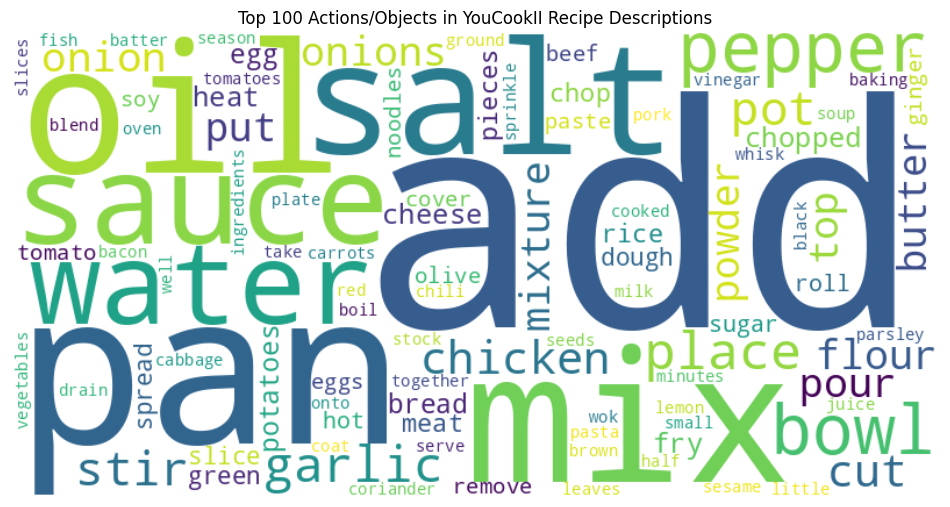

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Generate word cloud
def generate_wordcloud(word_freq_dict):
    wordcloud = WordCloud(width=800, height=400, background_color="white").generate_from_frequencies(word_freq_dict)

    # Display word cloud
    plt.figure(figsize=(12, 8))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.title("Top 100 Actions/Objects in YouCookII Recipe Descriptions")
    plt.show()

# Create the word cloud from the top actions/objects
generate_wordcloud(top_100_actions_objects)


#3.3 Data Pre-processing

Pre-process collected raw datasets based on cleaning and validation tools; present samples from pre processed datasets.

In [ ]:
# Get total number of unique videos
total_unique_videos = len(annotations['database'])
print(f"Total number of unique videos: {total_unique_videos}")

# Get all video IDs as a list
video_ids = list(annotations['database'].keys())

# Check for duplicates by comparing lengths
unique_video_ids = set(video_ids)  # Convert list to set to remove any duplicates
if len(video_ids) == len(unique_video_ids):
    print("No duplicates found in video IDs.")
else:
    print("Duplicates found in video IDs.")

# Optional: Display duplicate video IDs if any (for troubleshooting)
from collections import Counter
video_id_counts = Counter(video_ids)
duplicates = [video_id for video_id, count in video_id_counts.items() if count > 1]
if duplicates:
    print("Duplicate video IDs:", duplicates)


Total number of unique videos: 1790
No duplicates found in video IDs.


In [ ]:
import os

# Path to the video folder
video_path = '/content/drive/Shareddrives/DATA 298A Team 8/videos'

# Define common video file extensions
video_extensions = ['.mp4', '.avi', '.mkv', '.mov', '.flv', '.webm']

# Initialize the video file count
video_count = 0

# Iterate through all files in the folder
for filename in os.listdir(video_path):
    # Get the file extension
    ext = os.path.splitext(filename)[1].lower()
    # If the file is a video format, increment the count
    if ext in video_extensions:
        video_count += 1

# Output the number of video files
print(f'Number of video files: {video_count}')

Number of video files: 1587


Clean Data:
Remove Missing or Corrupt Files

In [ ]:
missing_or_corrupt_count = 0
valid_video_ids = []

for video_id, details in annotations['database'].items():
    # Construct the video file path by adding the .mp4 extension
    video_file = os.path.join(video_path, f"{video_id}.mp4")

    # Check if file exists and provide feedback
    if os.path.exists(video_file):
        #print(f"Checking video file: {video_file}")
        cap = cv2.VideoCapture(video_file)

        # Check if the file can be opened by OpenCV
        if cap.isOpened():
            valid_video_ids.append(video_id)
            #print(f"Video {video_id} opened successfully.")
        else:
            #print(f"Corrupt video file: {video_id}.mp4")
            missing_or_corrupt_count += 1
        cap.release()
    else:
        #print(f"Missing video file: {video_id}.mp4")
        missing_or_corrupt_count += 1

# Update annotations to include only valid videos
annotations['database'] = {k: v for k, v in annotations['database'].items() if k in valid_video_ids}

print(f"Total valid videos found: {len(valid_video_ids)}")
print(f"Total missing or corrupt videos: {missing_or_corrupt_count}")

Total valid videos found: 1587
Total missing or corrupt videos: 203


Remove Duplicate Videos

In [ ]:
from collections import defaultdict

# Check for duplicate files by size
size_dict = defaultdict(list)
for video_id in valid_video_ids:
    video_file = os.path.join(video_path, f"{video_id}.mp4")
    file_size = os.path.getsize(video_file)
    size_dict[file_size].append(video_id)

# Remove duplicates based on file size
unique_video_ids = set()
for size, ids in size_dict.items():
    if len(ids) > 1:
        print(f"Duplicates found for size {size} bytes: {ids}")
        unique_video_ids.add(ids[0])  # Keep the first one
    else:
        unique_video_ids.add(ids[0])

# Filter annotations to only include unique videos
annotations['database'] = {k: v for k, v in annotations['database'].items() if k in unique_video_ids}

Validate Annotations:
Ensure each annotation’s start and end times are within the video’s total duration.

In [ ]:
for video_id, details in annotations['database'].items():
    video_file = os.path.join(video_path, f"{video_id}.mp4")
    cap = cv2.VideoCapture(video_file)

    # Calculate video duration correctly
    fps = cap.get(cv2.CAP_PROP_FPS)
    frame_count = cap.get(cv2.CAP_PROP_FRAME_COUNT)
    video_duration = frame_count / fps if fps > 0 else 0  # Handle zero fps just in case
    cap.release()

    # Filter out invalid segments
    valid_segments = []
    for ann in details['annotations']:
        start, end = ann['segment']
        if 0 <= start <= video_duration and 0 <= end <= video_duration:
            valid_segments.append(ann)
        else:
            print(f"Invalid segment in video {video_id}: {ann}")

    # Update annotations with only valid segments
    annotations['database'][video_id]['annotations'] = valid_segments

In [ ]:
def preprocess_annotations(annotations):
    processed_annotations = {}
    for video_id, details in annotations['database'].items():
        processed_annotations[video_id] = {
            'duration': details['duration'],
            'subset': details['subset'],
            'annotations': details['annotations'],
            'url': details.get('video_url')
        }
    return processed_annotations

processed_annotations = preprocess_annotations(annotations)

#3.4 Data Transformation

Transform pre-processed datasets to desired formats based on tools and scripts; present samples  from transformed datasets.

In [ ]:
output_video_path = '/content/drive/Shareddrives/DATA 298A Team 8/videos'

In [ ]:
class VideoDataset(Dataset):
    def __init__(self, video_path, annotations, transform=None):
        self.video_path = video_path
        self.transform = transform

        # Access the 'database' key in annotations
        if 'database' in annotations:
            self.annotations = annotations['database']
        else:
            print("Error: 'database' key not found in annotations.")
            self.annotations = {}

        # Retrieve video IDs from within 'database' and check if corresponding files exist
        self.video_files = [
            f"{video_id}.mp4" for video_id in self.annotations.keys()
            if os.path.exists(os.path.join(video_path, f"{video_id}.mp4"))
        ]

        # Debug: Display all matched files and unmatched annotation keys
        print(f"Total annotated videos: {len(self.annotations)}")
        print(f"Number of valid video files (matching annotations): {len(self.video_files)}")

        # Identify unmatched video IDs
        missing_videos = [
            video_id for video_id in self.annotations.keys()
            if f"{video_id}.mp4" not in self.video_files
        ]
        if missing_videos:
            print(f"Missing video files for IDs: {missing_videos[:10]} ...")  # Show a sample of missing IDs if any

    def __len__(self):
        return len(self.video_files)

    def __getitem__(self, idx):
        video_file = self.video_files[idx]
        video_id = video_file.split('.')[0]
        video_details = self.annotations.get(video_id)
        video_path = os.path.join(self.video_path, video_file)

        # Load video frames if file exists
        cap = cv2.VideoCapture(video_path)
        frames = []
        while cap.isOpened():
            ret, frame = cap.read()
            if not ret:
                break
            frame = cv2.resize(frame, (128, 128))
            frames.append(frame)
        cap.release()

        if self.transform:
            frames = self.transform(frames)

        return torch.tensor(frames, dtype=torch.float32), video_details['annotations']

In [ ]:
from torchvision import transforms

# Define augmentations with resizing only for augmented frames
augmentation_transforms = transforms.Compose([
    transforms.Resize((128, 128)),  # Resize only for augmented frames
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1)
])

#3.5 Data Preparation

Prepare training, validation and test datasets from transformed datasets; present samples from prepared datasets.

In [ ]:
import os
import shutil
from torch.utils.data import random_split
import torch

# Define paths
output_video_path = '/content/drive/Shareddrives/DATA 298A Team 8/videos'
split_base_path = '/content/drive/Shareddrives/DATA 298A Team 8/split_videos'

# Initialize VideoDataset (assuming VideoDataset class is defined and annotations are loaded)
dataset = VideoDataset(output_video_path, annotations)

# Split dataset into training, validation, and test sets
train_size = int(0.7 * len(dataset))
val_size = int(0.15 * len(dataset))
test_size = len(dataset) - train_size - val_size
train_dataset, val_dataset, test_dataset = random_split(dataset, [train_size, val_size, test_size])


Total annotated videos: 1790
Number of valid video files (matching annotations): 1587
Missing video files for IDs: ['4AIahLZfNq4', 'TkK7BbBNPaY', 'wch6oe0FjN8', 'MZbrWzqEntk', 'VH0SmCfAov4', 'HghNzA9BJAU', '6gObQR5Vm4M', 'aG7C1vjn1Lw', 'Tf-gY_-pT1U', 'sT594H2u4kk'] ...


In [ ]:
# # Function to copy dataset splits to respective folders
# def copy_split(dataset_split, split_name):
#     split_dir = os.path.join(split_base_path, split_name)
#     os.makedirs(split_dir, exist_ok=True)

#     for idx in range(len(dataset_split)):
#         # Get the index from the subset
#         original_idx = dataset_split.indices[idx]  # Get original index from the full dataset
#         video_file = dataset.video_files[original_idx]  # Retrieve the video filename from dataset's video_files
#         video_id = video_file.split('.')[0]  # Extract video ID from filename
#         source_path = os.path.join(output_video_path, video_file)

#         if os.path.exists(source_path):
#             destination_path = os.path.join(split_dir, video_file)
#             shutil.copy(source_path, destination_path)
#         else:
#             print(f"Warning: Video {video_file} not found in original folder.")

# # Copy each split to its respective folder without modifying the original folder
# copy_split(train_dataset, 'train')
# copy_split(val_dataset, 'val')
# copy_split(test_dataset, 'test')

# print("Data has been split and copied into 'train', 'val', and 'test' folders.")

Data has been split and copied into 'train', 'val', and 'test' folders.


In [ ]:
# Function to count files in each split folder
def count_files_in_split_folders(split_base_path):
    for split_name in ['train', 'val', 'test']:
        split_dir = os.path.join(split_base_path, split_name)
        file_count = len(os.listdir(split_dir))
        print(f"Number of videos in '{split_name}' folder: {file_count}")

# Run the count function
count_files_in_split_folders(split_base_path)

Number of videos in 'train' folder: 1110
Number of videos in 'val' folder: 238
Number of videos in 'test' folder: 239


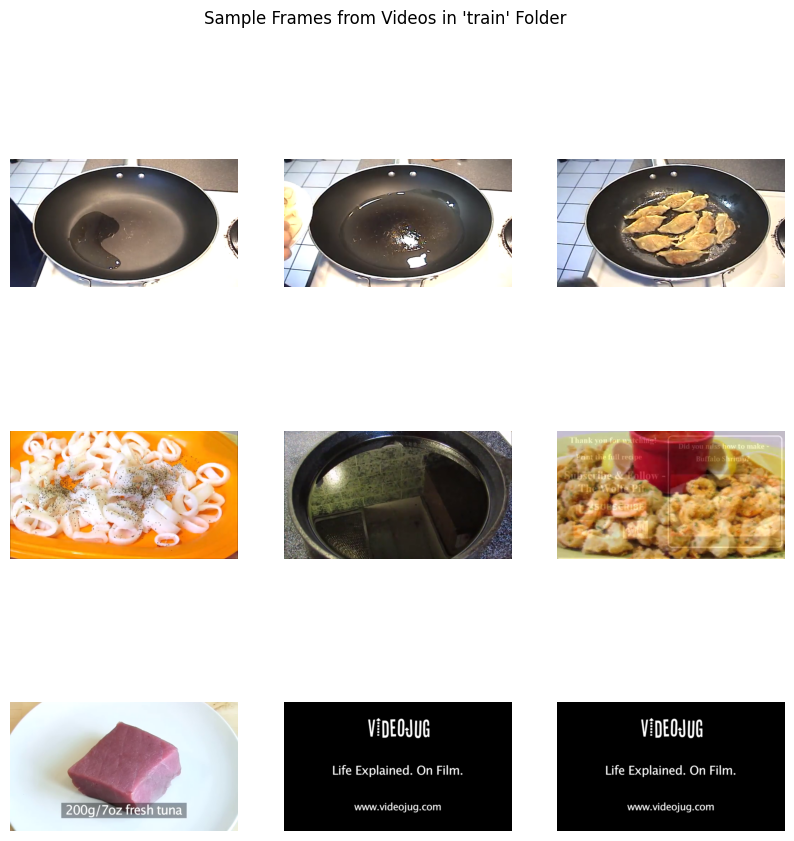

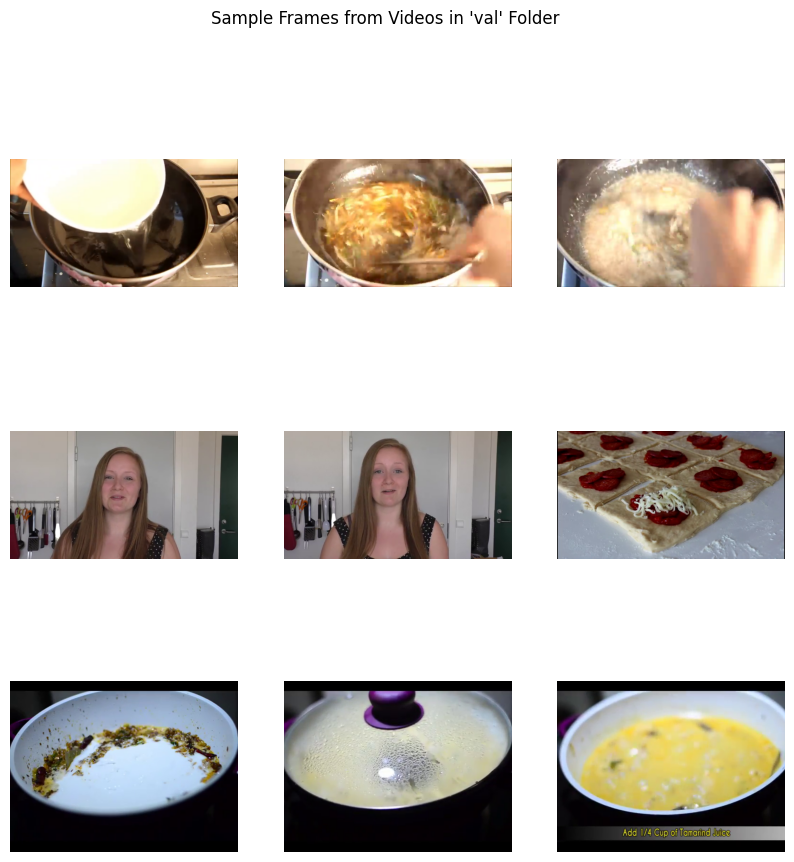

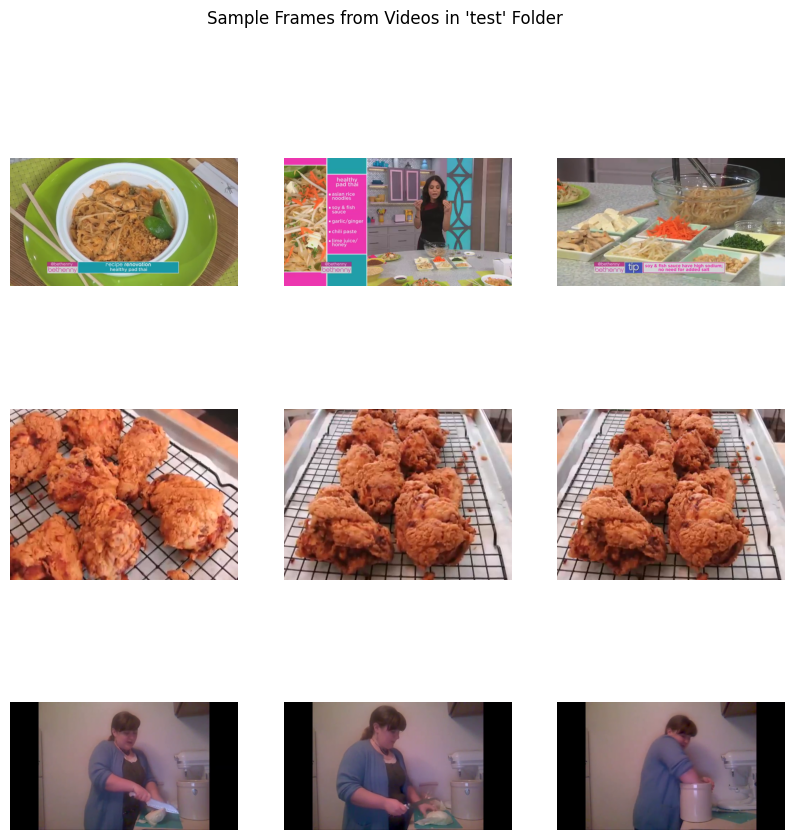

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt
import random


# Function to extract and display random frames from video files in a given split folder
def visualize_frames_from_videos(split_name, num_videos=3, frames_per_video=3):
    split_dir = os.path.join(split_base_path, split_name)
    video_files = [f for f in os.listdir(split_dir) if f.endswith('.mp4')]  # Filter for video files

    # Randomly sample a few videos
    sample_videos = random.sample(video_files, min(num_videos, len(video_files)))

    plt.figure(figsize=(10, 10))
    plt.suptitle(f"Sample Frames from Videos in '{split_name}' Folder")

    for i, video_file in enumerate(sample_videos):
        video_path = os.path.join(split_dir, video_file)

        # Open the video file
        cap = cv2.VideoCapture(video_path)
        total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

        # Select random frames to display
        frame_indices = sorted(random.sample(range(total_frames), frames_per_video))

        for j, frame_idx in enumerate(frame_indices):
            cap.set(cv2.CAP_PROP_POS_FRAMES, frame_idx)
            ret, frame = cap.read()

            if ret:
                # Convert the frame from BGR to RGB for display
                frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

                # Display the frame
                plt.subplot(num_videos, frames_per_video, i * frames_per_video + j + 1)
                plt.imshow(frame)
                plt.axis("off")
            else:
                print(f"Warning: Unable to read frame {frame_idx} from {video_file}.")

        # Release video capture after processing
        cap.release()

    plt.show()

# Visualize frames from each split folder
visualize_frames_from_videos('train')
visualize_frames_from_videos('val')
visualize_frames_from_videos('test')


In [ ]:
from transformers import AutoTokenizer, AutoModel

class TextEncoder(nn.Module):
    def __init__(self, model_name="bert-base-uncased"):
        super(TextEncoder, self).__init__()
        self.tokenizer = AutoTokenizer.from_pretrained(model_name)
        self.model = AutoModel.from_pretrained(model_name)

    def forward(self, text):
        inputs = self.tokenizer(text, return_tensors="pt", padding=True, truncation=True)
        outputs = self.model(**inputs)
        return outputs.last_hidden_state.mean(dim=1)  # Use mean pooling for a sentence representation

Text Sample: spread margarine on two slices of white bread
Tokenized Text: {'input_ids': tensor([[  101,  3659,  9388,  6843,  3170,  2006,  2048, 25609,  1997,  2317,
          7852,   102]]), 'token_type_ids': tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]]), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]])}
Text Embedding: [[ 2.12219343e-01  1.44185254e-03 -1.03971474e-01 -9.31048393e-03
   3.19606632e-01  1.64432451e-01 -2.46309519e-01  4.93798405e-01
  -2.63867170e-01 -4.15088296e-01  3.01584125e-01 -3.20734292e-01
   8.14334378e-02  1.36844337e-01 -3.03130090e-01  3.79774600e-01
   2.42822841e-01 -3.14379275e-01 -1.12919547e-01  2.00261593e-01
   2.94051766e-01 -5.50324857e-01 -5.82618892e-01  4.56859350e-01
   5.48095167e-01 -7.06113577e-02 -1.91482559e-01 -1.39093950e-01
   2.04335436e-01 -2.70261973e-01  1.75590917e-01  1.64094105e-01
   5.72249889e-01 -1.55561849e-01  4.21322137e-01 -1.19877927e-01
   6.84153616e-01  1.06572866e-01 -6.97641850e-01  3.04754704e-0

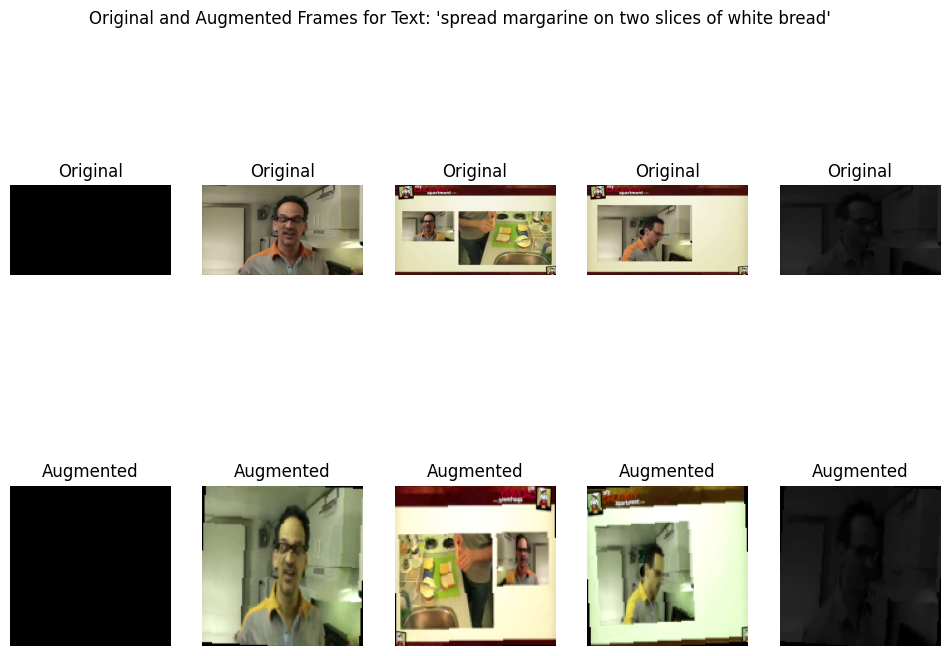

Text Sample: pick the ends off the verdalago
Tokenized Text: {'input_ids': tensor([[  101,  4060,  1996,  4515,  2125,  1996,  2310, 13639, 17802,  2080,
           102]]), 'token_type_ids': tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]]), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]])}
Text Embedding: [[-1.16362954e-02 -5.31247199e-01  1.70064270e-01  2.46778145e-01
  -4.49573249e-02  1.46188125e-01  1.07497022e-01  2.65705943e-01
   3.32956985e-02 -1.60955369e-01  1.94383293e-01 -2.16725841e-02
  -1.00782998e-01  3.12002063e-01 -2.45989755e-01  3.38514388e-01
  -2.41850957e-01 -3.98139469e-02 -3.28696170e-03 -1.04646914e-01
   2.53351331e-01 -2.99143642e-01  5.68270124e-03  3.20629805e-01
   3.80729020e-01  2.12882995e-03 -1.04049727e-01 -8.96367803e-02
   8.28728154e-02 -1.42411059e-02  1.29451856e-01 -7.59703992e-03
   3.21565717e-02 -3.40447724e-01  2.00656634e-02 -1.68926895e-01
   2.36319244e-01 -1.87259197e-01 -4.26429302e-01 -7.17350617e-02
  -5.17048120e-01 -8.0929

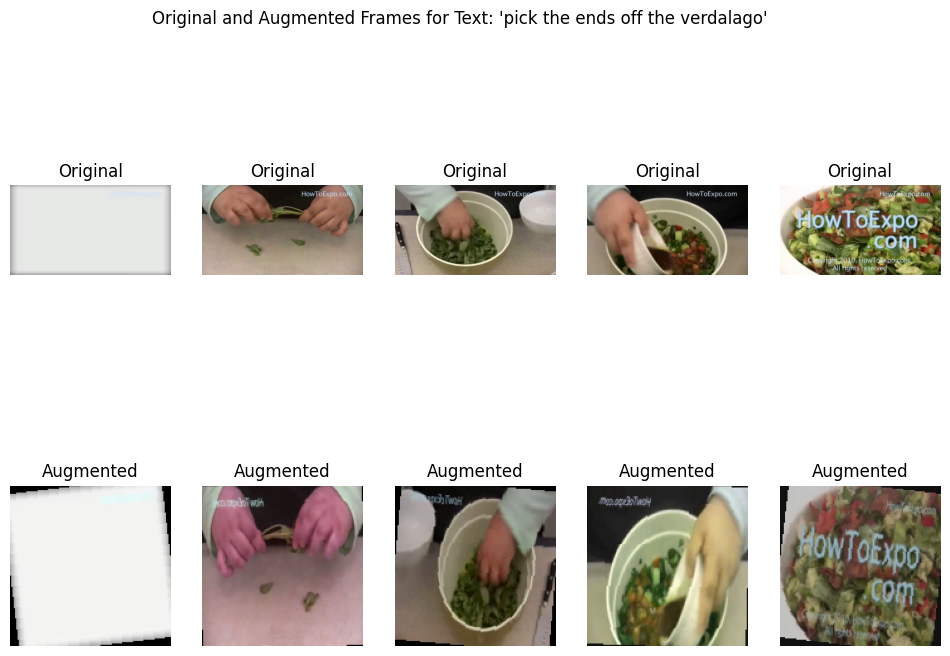

Text Sample: combine salt butter milk and hot sauce in a bowl
Tokenized Text: {'input_ids': tensor([[  101, 11506,  5474, 12136,  6501,  1998,  2980, 12901,  1999,  1037,
          4605,   102]]), 'token_type_ids': tensor([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]]), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]])}
Text Embedding: [[-2.46289019e-02  1.25656739e-01 -1.36686236e-01  1.84767917e-01
   3.29623640e-01 -1.19693793e-01 -1.82157919e-01  3.92930597e-01
   1.24671496e-01 -4.70554858e-01  3.88612419e-01 -4.55309153e-01
   1.44964859e-01  4.85645026e-01 -3.82468134e-01  1.91763923e-01
   3.62039596e-01  7.67878219e-02  2.04920217e-01  8.74229670e-01
   2.91906446e-01 -5.92822015e-01 -2.82716662e-01  1.07421555e-01
   4.45233107e-01  3.24226826e-01 -1.87839985e-01  7.70899579e-02
   4.51173276e-01 -5.16937912e-01  3.71636868e-01  3.52993578e-01
   4.59108233e-01 -3.51428837e-01  5.09758949e-01  6.48765489e-02
   7.58517504e-01  2.22241342e-01 -5.14377952e-01  4.52296324

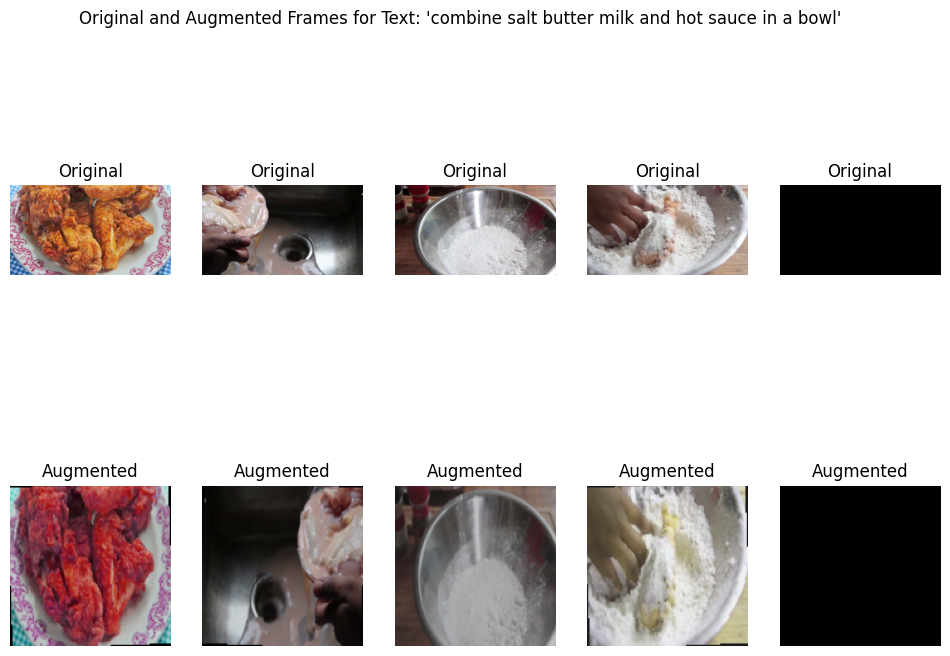

In [ ]:
import os
import json
import cv2
import torch
import matplotlib.pyplot as plt
import numpy as np
from transformers import AutoTokenizer, AutoModel

# Define paths
annotations_path = '/content/drive/Shareddrives/DATA 298A Team 8/youcook/annotations/youcookii_annotations_trainval.json'
video_folder_path = '/content/drive/Shareddrives/DATA 298A Team 8/split_videos/train'

# Load annotations from JSON
with open(annotations_path, 'r') as f:
    annotations = json.load(f)

# Initialize tokenizer and model for text embedding
tokenizer = AutoTokenizer.from_pretrained("bert-base-uncased")
model = AutoModel.from_pretrained("bert-base-uncased")

# Display video frames, augmented frames, tokenized text, and embeddings for selected samples
def process_and_display_samples(num_samples=3, frames_per_video=5):
    video_ids = list(annotations['database'].keys())[:num_samples]  # Limit the number of samples

    for video_id in video_ids:
        video_file_path = os.path.join(video_folder_path, f"{video_id}.mp4")

        # Check if the video file exists
        if not os.path.exists(video_file_path):
            print(f"Video file {video_file_path} not found.")
            continue

        # Extract a sample text description
        annotation = annotations['database'][video_id]['annotations']
        if annotation and 'sentence' in annotation[0]:
            text_sample = annotation[0]['sentence']
            print(f"Text Sample: {text_sample}")

            # Process and print tokenized text
            tokenized_text = tokenizer(text_sample, return_tensors="pt")
            print("Tokenized Text:", tokenized_text)

            # Get text embedding
            with torch.no_grad():
                embedding_output = model(**tokenized_text)
                text_embedding = embedding_output.last_hidden_state.mean(dim=1)  # Mean pooling
            print("Text Embedding:", text_embedding.numpy())

            # Load video frames
            cap = cv2.VideoCapture(video_file_path)
            frames = []
            augmented_frames = []
            total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

            # Select evenly spaced frames
            frame_indices = np.linspace(0, total_frames - 1, frames_per_video, dtype=int)

            for idx in frame_indices:
                cap.set(cv2.CAP_PROP_POS_FRAMES, idx)
                ret, frame = cap.read()
                if ret:
                    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
                    frames.append(frame_rgb)

                    # Convert frame to PIL Image for augmentation
                    pil_frame = transforms.ToPILImage()(frame_rgb)
                    augmented_frame = augmentation_transforms(pil_frame)
                    augmented_frames.append(augmented_frame)
                else:
                    print(f"Warning: Could not read frame {idx}")
            cap.release()

            # Visualize original and augmented frames side by side
            plt.figure(figsize=(12, 8))
            plt.suptitle(f"Original and Augmented Frames for Text: '{text_sample}'")
            for i in range(frames_per_video):
                # Display original frames
                plt.subplot(2, frames_per_video, i + 1)
                plt.imshow(frames[i])
                plt.title("Original")
                plt.axis("off")

                # Display augmented frames
                plt.subplot(2, frames_per_video, frames_per_video + i + 1)
                plt.imshow(augmented_frames[i])
                plt.title("Augmented")
                plt.axis("off")
            plt.show()

# Run the function
process_and_display_samples()


In [ ]:
# import os
# import json
# import cv2
# import torch
# import numpy as np
# from transformers import AutoTokenizer, AutoModel
# from tqdm import tqdm

# # Paths
# annotations_path = '/content/drive/Shareddrives/DATA 298A Team 8/youcook/annotations/youcookii_annotations_trainval.json'
# base_video_folder = '/content/drive/Shareddrives/DATA 298A Team 8/split_videos'  # Contains 'train', 'val', 'test' folders
# output_base_folder = '/content/drive/Shareddrives/DATA 298A Team 8/processed_data7'  # New folder to store processed data

# # Load annotations
# with open(annotations_path, 'r') as f:
#     annotations = json.load(f)

# # Ensure the output folder structure
# os.makedirs(output_base_folder, exist_ok=True)
# for split in ['train', 'val', 'test']:
#     os.makedirs(os.path.join(output_base_folder, split), exist_ok=True)

# # Function to check if a frame has significant difference from the previous frame
# def is_key_frame(current_frame, previous_frame, threshold=70):
#     diff = cv2.absdiff(current_frame, previous_frame)
#     mean_diff = np.mean(diff)
#     return mean_diff > threshold

# # Process function to save multiple embeddings and frames per sentence segment
# def process_and_save(split_name, frames_per_segment=5):
#     video_folder_path = os.path.join(base_video_folder, split_name)
#     output_folder_path = os.path.join(output_base_folder, split_name)
#     video_ids = os.listdir(video_folder_path)  # List all video files

#     for video_file in tqdm(video_ids, desc=f"Processing {split_name} data"):
#         video_id = video_file.split('.')[0]
#         video_file_path = os.path.join(video_folder_path, video_file)
#         if video_id not in annotations['database']:
#             continue

#         # Process each sentence and segment in the video annotations
#         annotations_list = annotations['database'][video_id]['annotations']
#         for idx, ann in enumerate(annotations_list):
#             text_sample = ann['sentence']
#             start, end = ann['segment']  # Start and end times for the segment

#             # Generate text embedding for each sentence
#             text_embedding = text_encoder(text_sample).detach().numpy()
#             np.save(os.path.join(output_folder_path, f"{video_id}_sentence{idx}_embedding.npy"), text_embedding)

#             # Load video and extract frames for the segment
#             cap = cv2.VideoCapture(video_file_path)
#             cap.set(cv2.CAP_PROP_POS_MSEC, start * 1000)  # Set start time in milliseconds
#             fps = cap.get(cv2.CAP_PROP_FPS)
#             frames = []
#             frame_count = 0
#             prev_frame = None

#             # Dynamic sampling rate based on scene type
#             frame_rate = 1 if "static" in text_sample else 2  # 1 FPS for static, 2 FPS for dynamic scenes
#             frame_interval = 1000 / frame_rate  # Convert FPS to millisecond interval

#             while cap.get(cv2.CAP_PROP_POS_MSEC) <= end * 1000:
#                 ret, frame = cap.read()
#                 if not ret:
#                     break

#                 frame_resized = cv2.resize(frame, (128, 128))  # Resize to uniform size

#                 # If no previous frame, or significant difference, add as a key frame
#                 if prev_frame is None or is_key_frame(frame_resized, prev_frame):
#                     frames.append(cv2.cvtColor(frame_resized, cv2.COLOR_BGR2RGB))
#                     prev_frame = frame_resized
#                     frame_count += 1

#                 # Skip frames dynamically based on the chosen interval
#                 cap.set(cv2.CAP_PROP_POS_MSEC, cap.get(cv2.CAP_PROP_POS_MSEC) + frame_interval)

#             cap.release()

#             # Save frames for this segment
#             frames_folder = os.path.join(output_folder_path, f"{video_id}_sentence{idx}_frames")
#             os.makedirs(frames_folder, exist_ok=True)
#             for i, frame in enumerate(frames):
#                 frame_path = os.path.join(frames_folder, f"frame_{i}.jpg")
#                 cv2.imwrite(frame_path, cv2.cvtColor(frame, cv2.COLOR_RGB2BGR))  # Convert back to BGR for saving

# # Process and save for train, val, and test sets
# for split in ['train', 'val', 'test']:
#     process_and_save(split)

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
Processing test data: 100%|██████████| 239/239 [06:33<00:00,  1.65s/it]



Details for 'train' dataset:

Video ID: --bv0V6ZjWI
  Sentence 1: crush and chop the garlic
  Embedding shape: (1, 768)


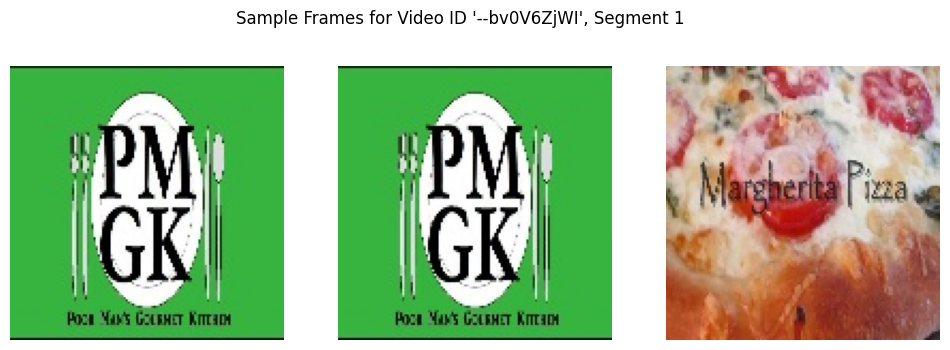

  Sentence 2: add oil garlic and salt to a bowl
  Embedding shape: (1, 768)


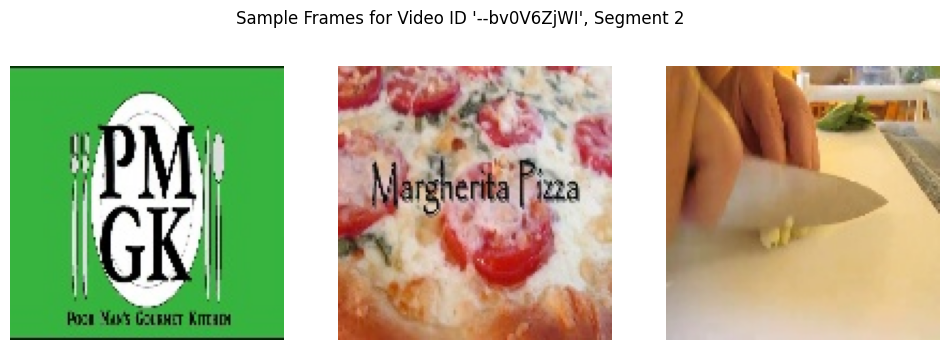

  Sentence 3: mix the tomoatoes with the oil mixture
  Embedding shape: (1, 768)


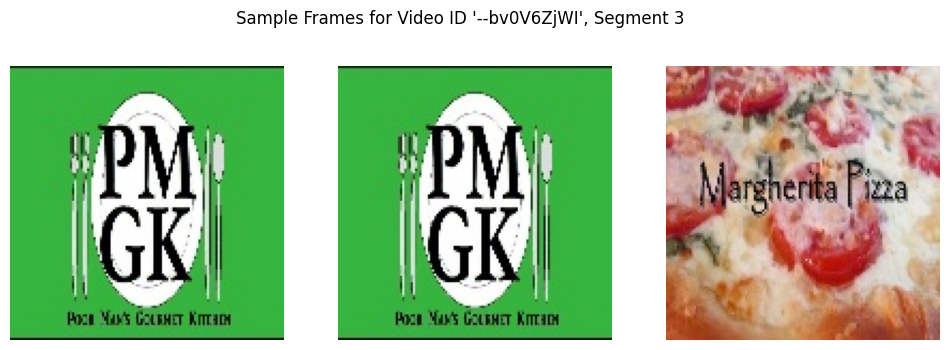

  Sentence 4: chop the basil
  Embedding shape: (1, 768)


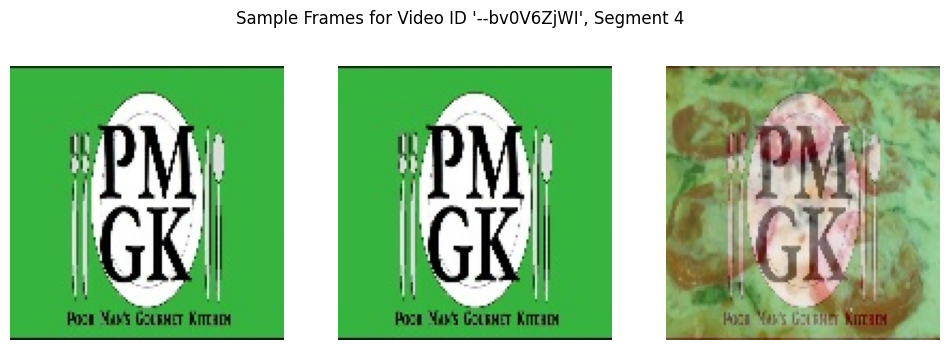

  Sentence 5: spread the oil mixture onto the dough
  Embedding shape: (1, 768)


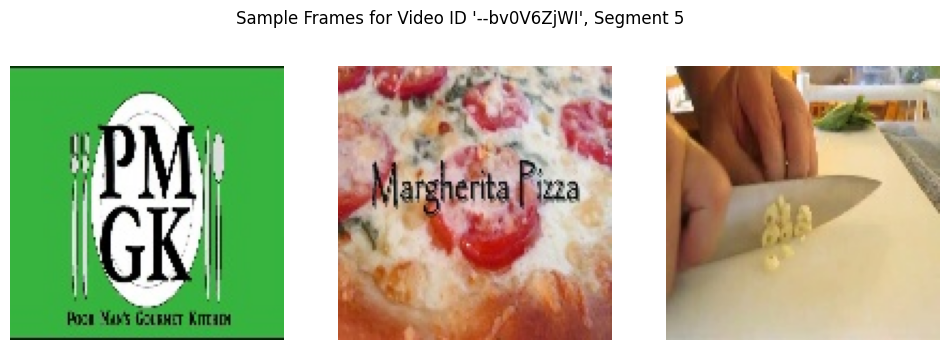

  Sentence 6: place provolone cheese and mozzarella cheese onto the dough
  Embedding shape: (1, 768)


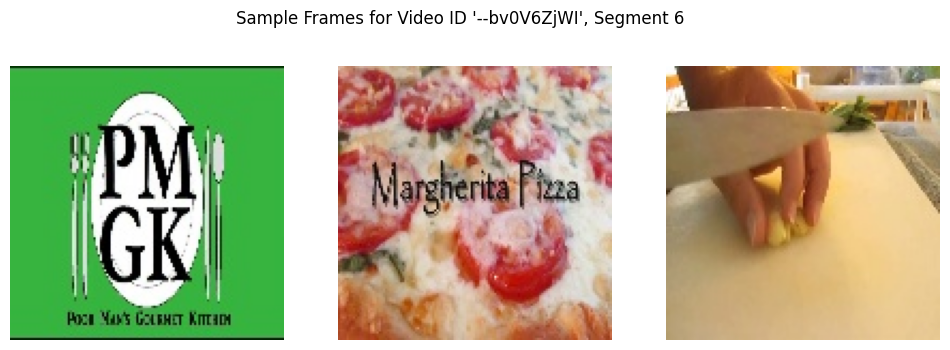

  Sentence 7: add the basil to the pizza
  Embedding shape: (1, 768)


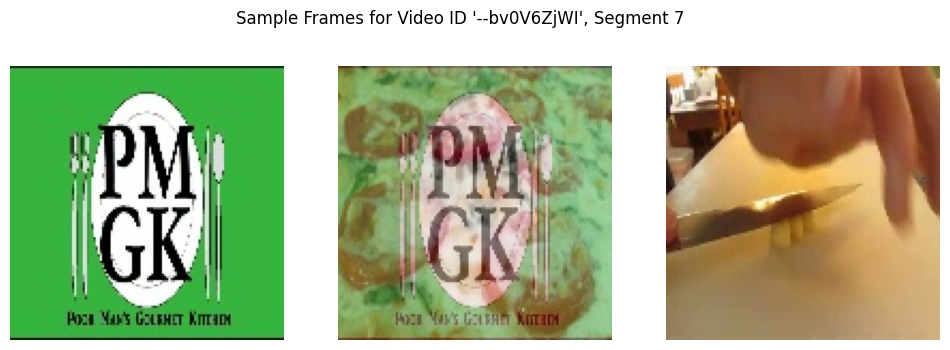

  Sentence 8: place the tomatoes on the pizza
  Embedding shape: (1, 768)


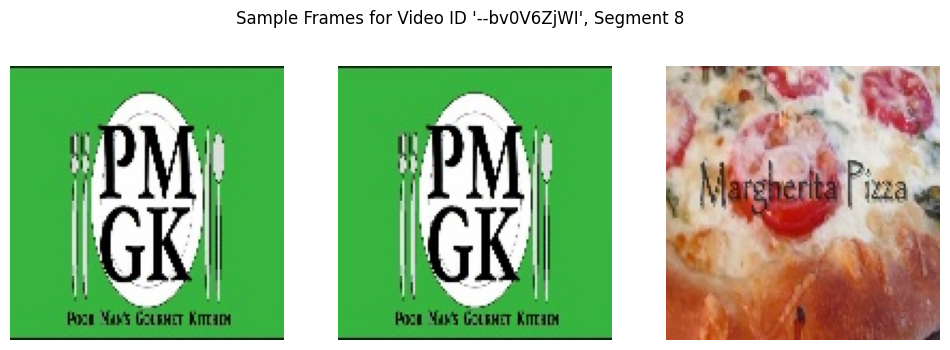

  Sentence 9: sprinkle cheese onto the pizza
  Embedding shape: (1, 768)


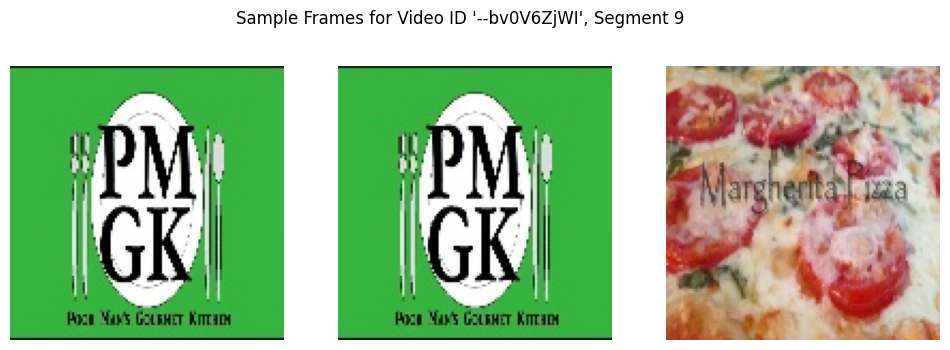

  Sentence 10: bake the pizza in an oven
  Embedding shape: (1, 768)


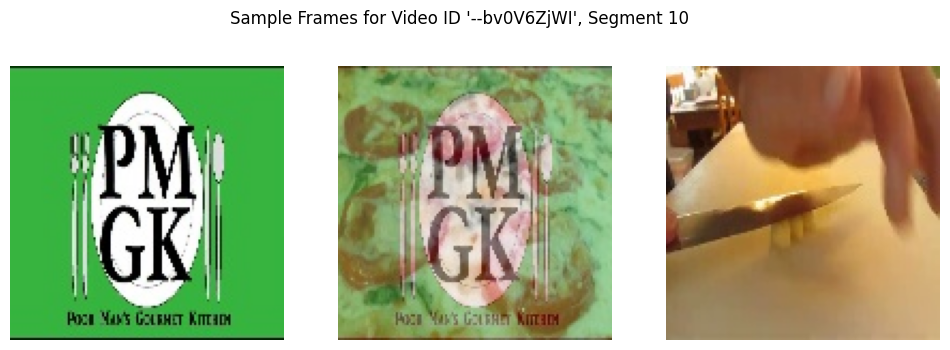


Details for 'val' dataset:

Video ID: -ORd4EBliqw
  Sentence 1: peel and cut the potato
  Embedding shape: (1, 768)


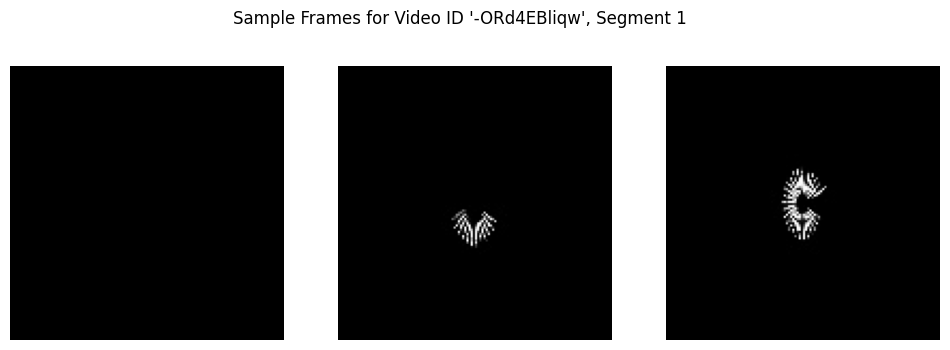

  Sentence 2: place the potatos into the water
  Embedding shape: (1, 768)


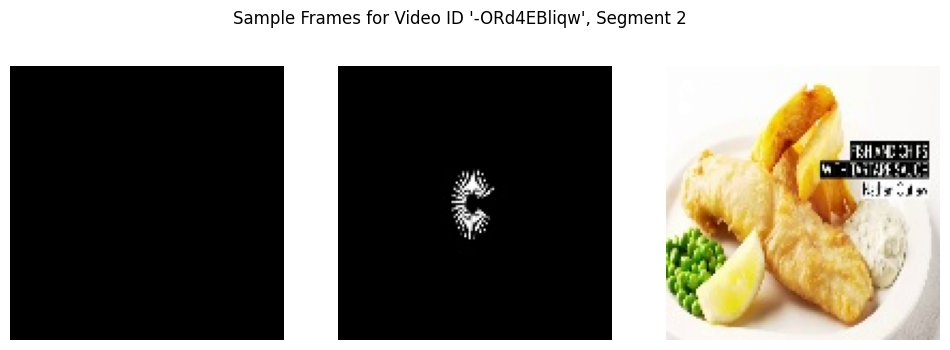

  Sentence 3: add the egg yolks mustard and vinegar to a bowl
  Embedding shape: (1, 768)


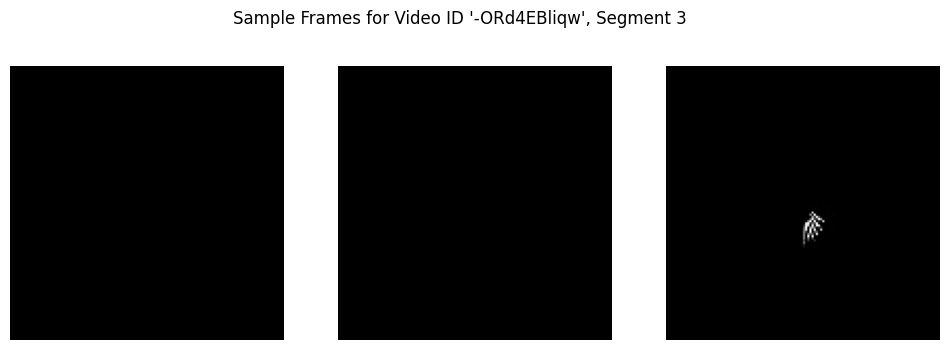

  Sentence 4: mix in oil with the eggs
  Embedding shape: (1, 768)


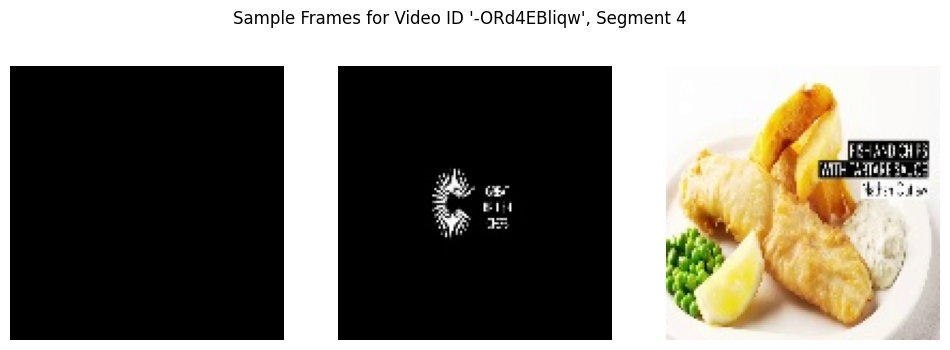

  Sentence 5: chop the capers and pickle
  Embedding shape: (1, 768)


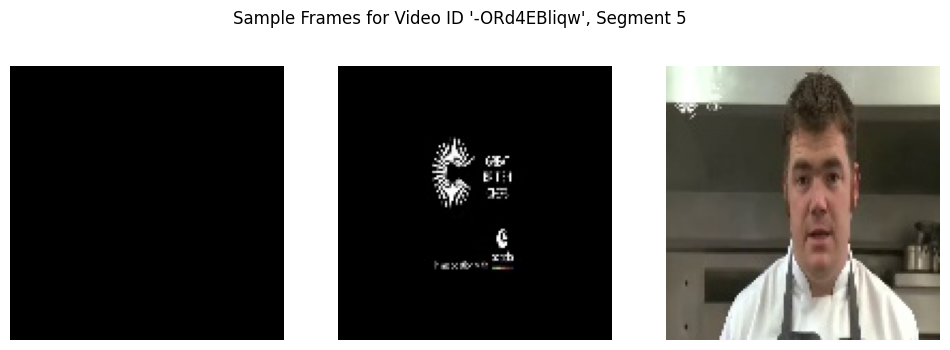

  Sentence 6: mix the herbs salt and pepper into the mayonnaise
  Embedding shape: (1, 768)


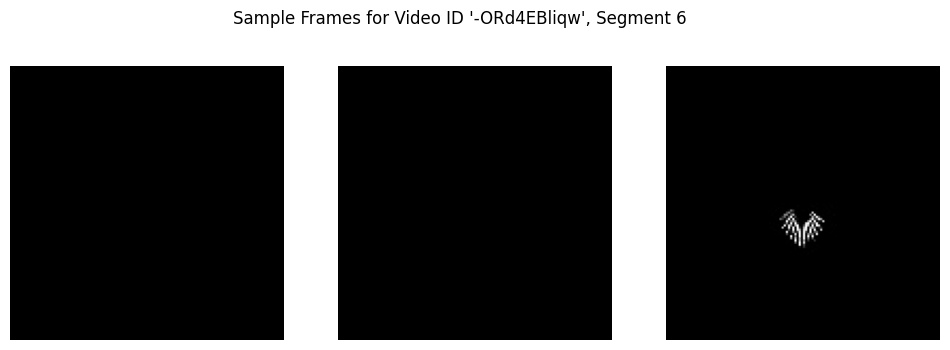

  Sentence 7: mix together the flour sugar yeast beer salt and pepper
  Embedding shape: (1, 768)


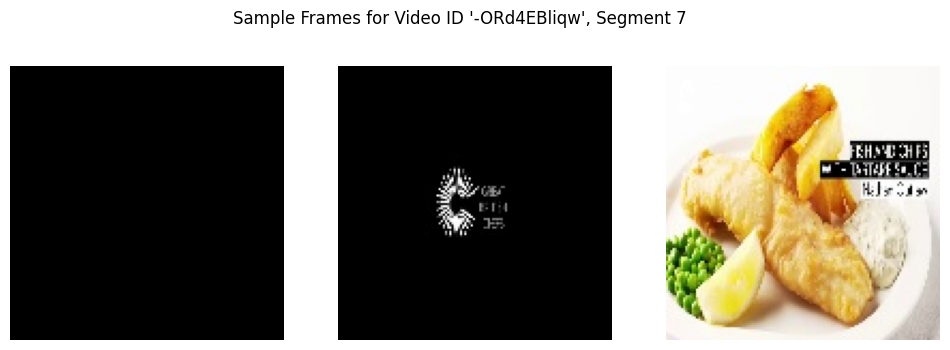

  Sentence 8: cut the skin off the fish and then cut into pieces
  Embedding shape: (1, 768)


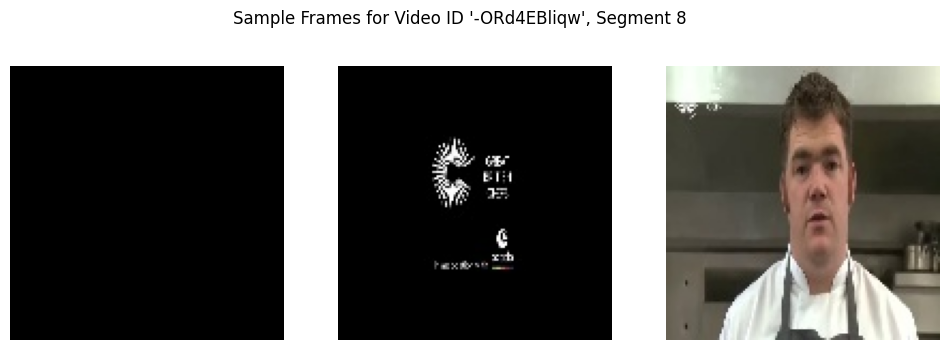

  Sentence 9: fry the potatos in the fryer
  Embedding shape: (1, 768)


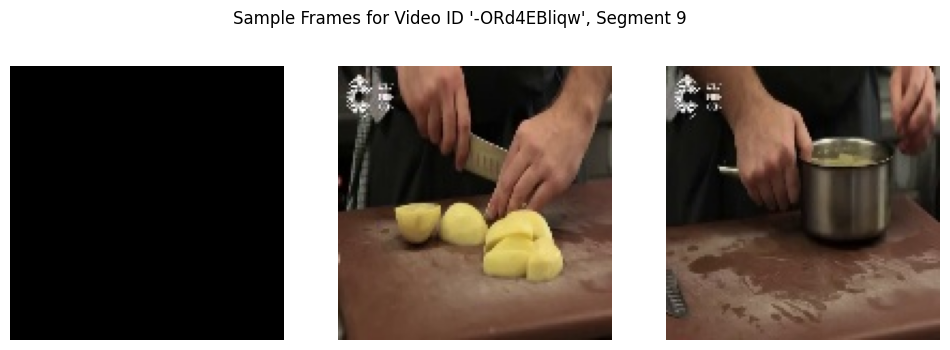

  Sentence 10: coat the fish in the flour and the batter
  Embedding shape: (1, 768)


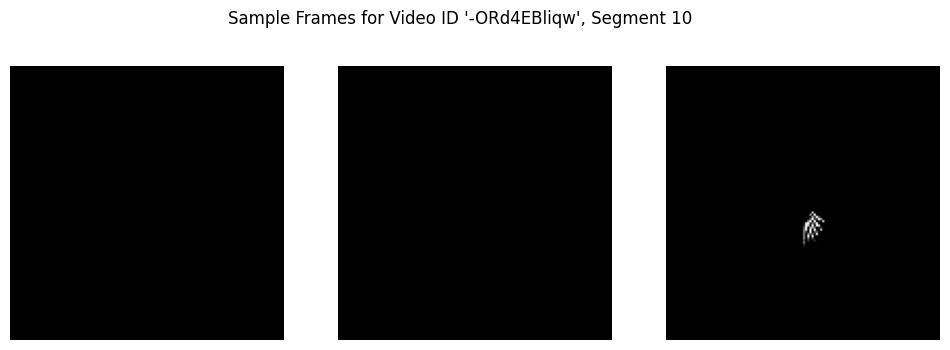

  Sentence 11: fry the fish in the fryer
  Embedding shape: (1, 768)


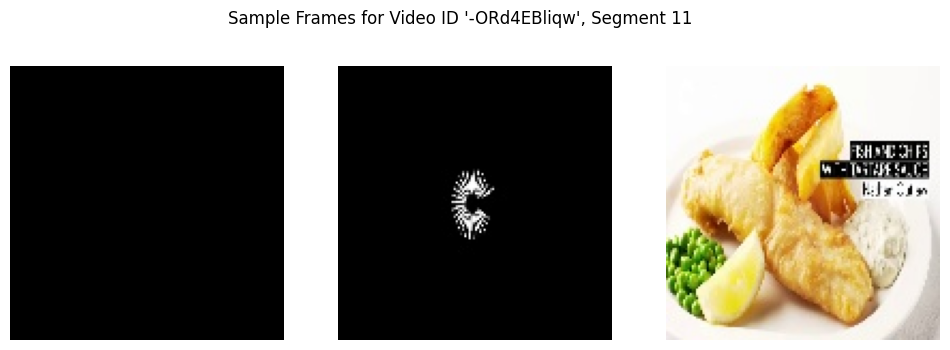


Details for 'test' dataset:

Video ID: -Ju39A-G0Dk
  Sentence 1: pour a can of kidney beans in a pot
  Embedding shape: (1, 768)


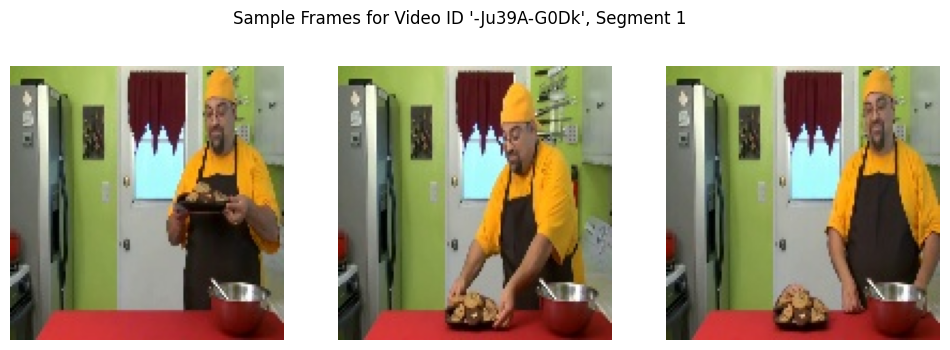

  Sentence 2: pour the tomato puree in
  Embedding shape: (1, 768)


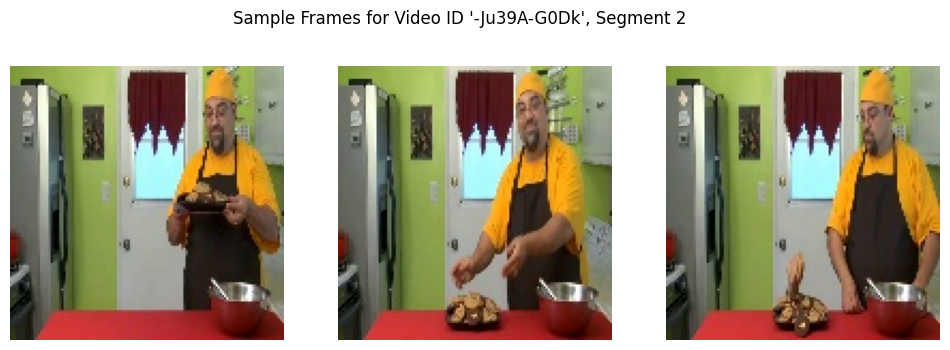

  Sentence 3: pour water into the pot
  Embedding shape: (1, 768)


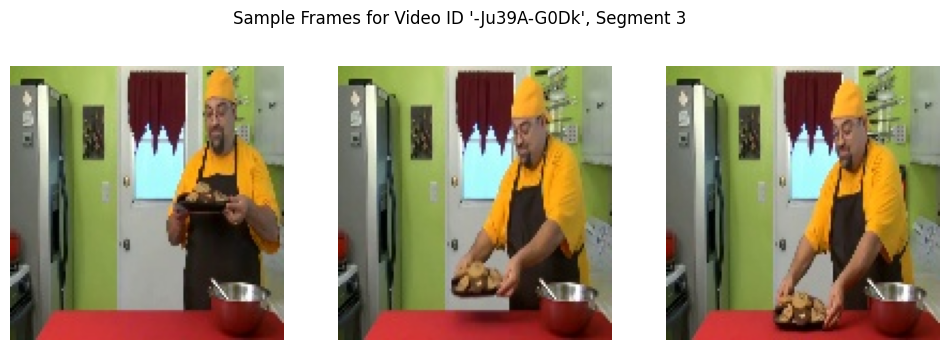

  Sentence 4: add some oregano to the pot
  Embedding shape: (1, 768)


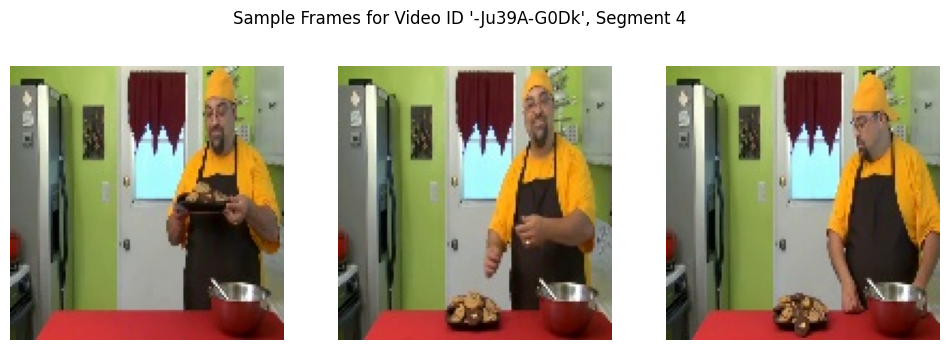

  Sentence 5: add some basil to the pot
  Embedding shape: (1, 768)


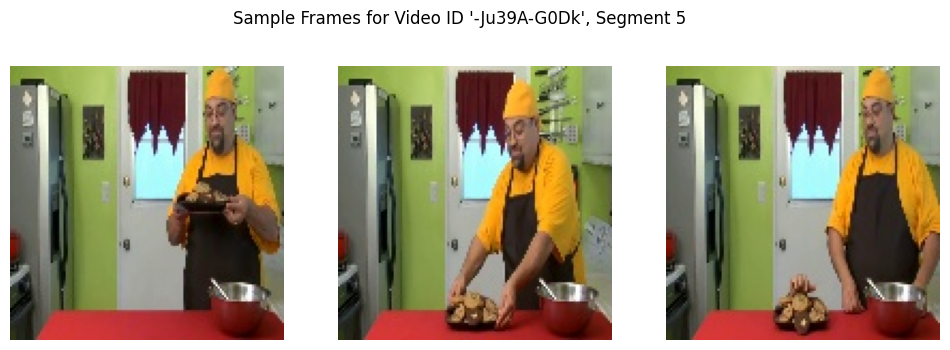

  Sentence 6: add a little bit salt and black pepper to the pot
  Embedding shape: (1, 768)


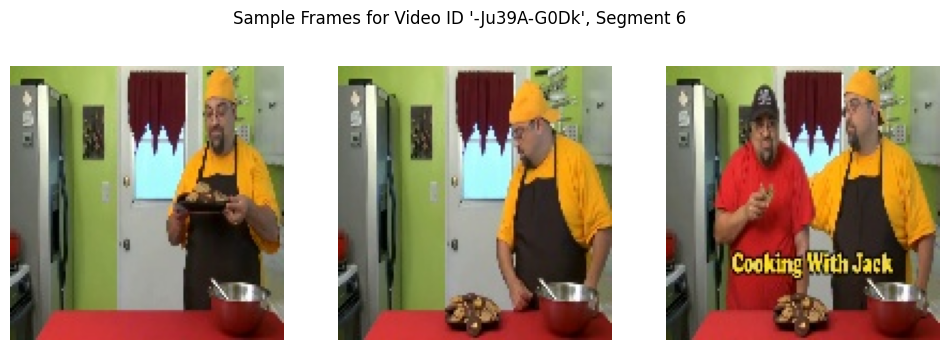

  Sentence 7: add garlic paste to the pot
  Embedding shape: (1, 768)


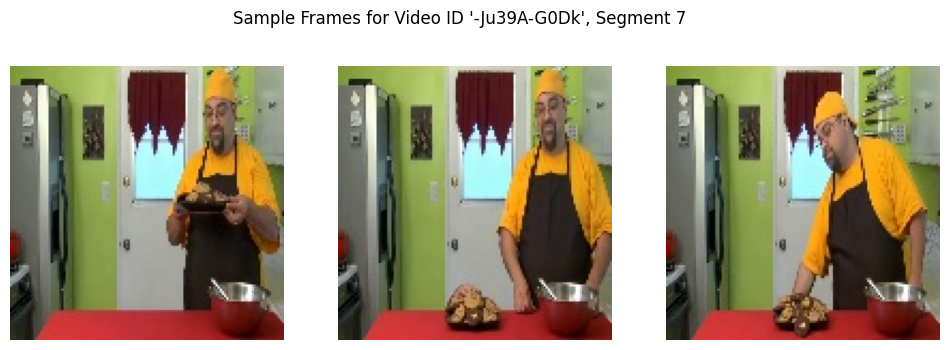

  Sentence 8: add chopped onion to the pot
  Embedding shape: (1, 768)


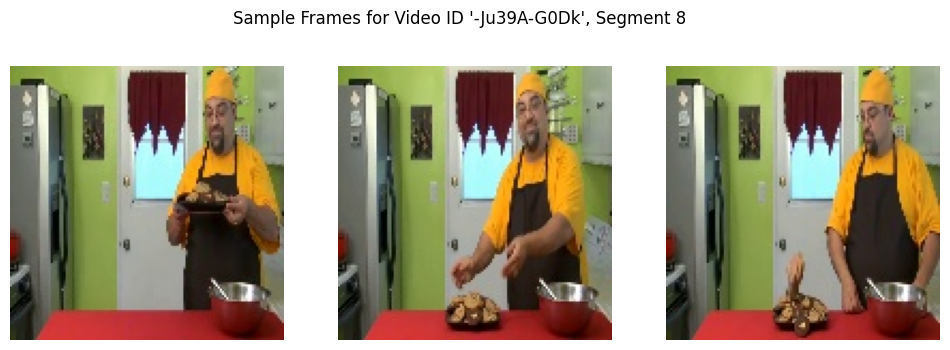

  Sentence 9: heat the soup and let it simmer
  Embedding shape: (1, 768)


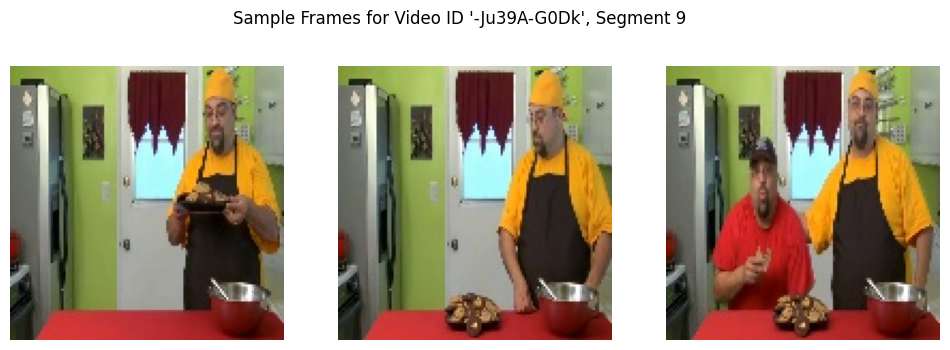

  Sentence 10: pour the soup on the macaroni
  Embedding shape: (1, 768)


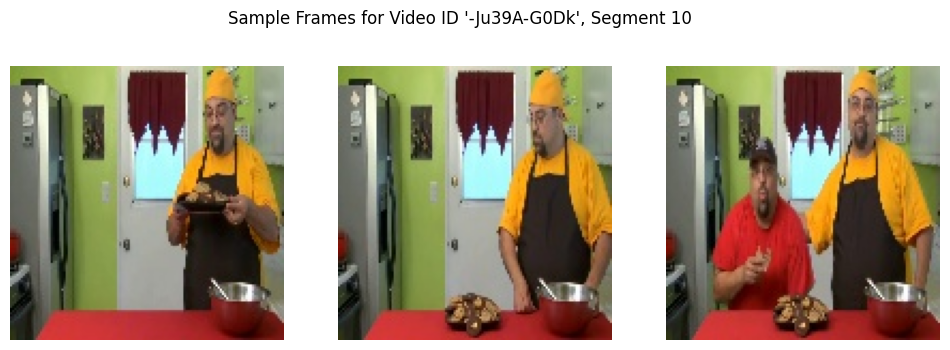

In [ ]:
import matplotlib.pyplot as plt
import cv2
import os
import numpy as np
import json

# Path to JSON file with sentences
json_file_path = '/content/drive/Shareddrives/DATA 298A Team 8/youcook/annotations/youcookii_annotations_trainval.json'

# Load sentences from the JSON file
with open(json_file_path, 'r') as json_file:
    annotations = json.load(json_file)

# Function to print and display details of processed output folders for 3 sample videos in each split
def print_and_display_output_details(output_base_folder, sample_size=1, frames_to_display=3):
    for split_name in ['train', 'val', 'test']:
        split_folder = os.path.join(output_base_folder, split_name)
        print(f"\nDetails for '{split_name}' dataset:")

        # Extract unique video IDs without '_sentence' suffix
        video_ids = sorted(set(f.split('_sentence')[0] for f in os.listdir(split_folder) if '_embedding.npy' in f))
        sampled_video_ids = video_ids[:sample_size]

        for video_id in sampled_video_ids:
            print(f"\nVideo ID: {video_id}")

            # Access sentences for the video ID from the JSON
            video_annotations = annotations.get('database', {}).get(video_id, {}).get('annotations', [])

            # Find all embeddings and their corresponding segment folders based on exact pattern
            embeddings = sorted([f for f in os.listdir(split_folder) if f.startswith(f"{video_id}_sentence") and f.endswith('_embedding.npy')])
            segments = sorted([f for f in os.listdir(split_folder) if f.startswith(f"{video_id}_sentence") and f.endswith('_frames')])

            for idx, embedding_file in enumerate(embeddings):
                # Load the sentence embedding
                sentence_file = os.path.join(split_folder, embedding_file)
                sentence_embedding = np.load(sentence_file)

                # Retrieve the corresponding sentence from the JSON file
                sentence_text = video_annotations[idx]['sentence'] if idx < len(video_annotations) else "No sentence available"

                # Display sentence and embedding details
                print(f"  Sentence {idx + 1}: {sentence_text}")
                print(f"  Embedding shape: {sentence_embedding.shape}")

                # Look for the corresponding segment folder by matching the index pattern
                segment_name = embedding_file.replace('_embedding.npy', '_frames')
                if segment_name in segments:
                    segment_folder = os.path.join(split_folder, segment_name)

                    # Load and display sample frames for this segment
                    frame_files = sorted([f for f in os.listdir(segment_folder) if f.endswith('.jpg')])[:frames_to_display]
                    frames = [cv2.imread(os.path.join(segment_folder, f)) for f in frame_files]

                    # Plot frames
                    plt.figure(figsize=(12, 4))
                    plt.suptitle(f"Sample Frames for Video ID '{video_id}', Segment {idx + 1}")
                    for i, frame in enumerate(frames):
                        if frame is not None:  # Check if frame was loaded correctly
                            frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)  # Convert to RGB for display
                            plt.subplot(1, frames_to_display, i + 1)
                            plt.imshow(frame_rgb)
                            plt.axis("off")
                    plt.show()
                else:
                    print(f"  Warning: No segment folder found for Sentence {idx + 1}.")

# Run this after processing to print details and display sample frames for 3 sample videos in each split
output_base_folder = '/content/drive/Shareddrives/DATA 298A Team 8/processed_data'  # Path to processed data
print_and_display_output_details(output_base_folder)

#3.6 Data Statistics

Summarize data preparation results, including raw, pre-processed, transformed and prepared  datasets; statistically present the results in visualization formats.

In [ ]:
import pandas as pd
import json
from datetime import timedelta
import os
import numpy as np
import matplotlib.pyplot as plt

# Path to the JSON file with annotations
annotations_path = '/content/drive/Shareddrives/DATA 298A Team 8/youcook/annotations/youcookii_annotations_trainval.json'

# Load annotations
with open(annotations_path, 'r') as f:
    annotations = json.load(f)

# Function to convert seconds to HH:MM:SS format
def seconds_to_hhmmss(seconds):
    return str(timedelta(seconds=int(seconds)))

# Specify the video ID for which you want to create the table
video_id = '4eWzsx1vAi8'  # Example video ID, replace with desired ID
video_data = annotations['database'].get(video_id)

# Check if the video exists in the annotations
if video_data:
    # Collect segment data for the table
    segments_data = []
    for idx, segment in enumerate(video_data['annotations'], start=1):
        start_time = seconds_to_hhmmss(segment['segment'][0])
        end_time = seconds_to_hhmmss(segment['segment'][1])
        description = segment['sentence']
        segments_data.append([idx, start_time, end_time, description])

    # Create a DataFrame for display
    df = pd.DataFrame(segments_data, columns=["ID", "Start Time", "End Time", "Description"])

    # Display the video ID and table
    print(f"An example of the annotated recipes. ID: {video_id}\n")
    display(df)
else:
    print(f"Video ID '{video_id}' not found in annotations.")

An example of the annotated recipes. ID: 4eWzsx1vAi8



,ID,Start Time,End Time,Description
0,1,0:00:23,0:00:48,grill tomatoes in pan of oil
1,2,0:00:49,0:00:52,remove and put tomatoes on a plate
2,3,0:00:53,0:01:37,add oil and bacon to frying pan
3,4,0:01:38,0:01:53,drain on a paper towel
4,5,0:01:54,0:02:42,spread mayo on bread
5,6,0:02:44,0:03:07,place lettuce and tomatoes on bread
6,7,0:03:08,0:03:16,sprinkle on salt and pepper
7,8,0:03:17,0:03:30,add bacon and cover with second bread


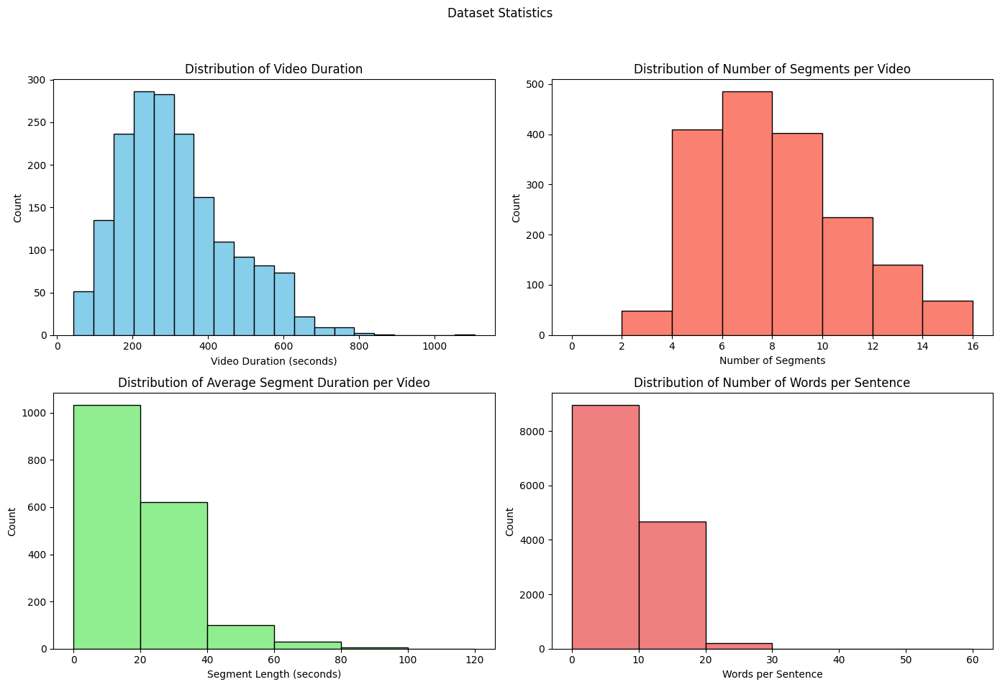

In [ ]:
# Initialize lists to store data for each plot
video_durations = []
num_segments_per_video = []
average_segment_durations = []  # New list for average segment duration per video
num_words_per_sentence = []

# Collect statistics from annotations
for video_id, video_data in annotations['database'].items():
    # Video duration
    video_durations.append(video_data['duration'])

    # Number of segments in each video
    segments = video_data['annotations']
    num_segments_per_video.append(len(segments))

    # Calculate average segment duration for each video
    segment_durations = [end - start for segment in segments for start, end in [segment['segment']]]
    if segment_durations:
        average_segment_durations.append(np.mean(segment_durations))  # Store only the average per video

    # Word count per sentence
    for segment in segments:
        sentence = segment['sentence']
        num_words_per_sentence.append(len(sentence.split()))

# Plot distributions
fig, axs = plt.subplots(2, 2, figsize=(14, 10))
fig.suptitle("Dataset Statistics")

# (a) Distribution of video duration (adjusted bin range)
axs[0, 0].hist(video_durations, bins=20, color='skyblue', edgecolor='black')
axs[0, 0].set_title("Distribution of Video Duration")
axs[0, 0].set_xlabel("Video Duration (seconds)")
axs[0, 0].set_ylabel("Count")

# (b) Distribution of number of segments per video
axs[0, 1].hist(num_segments_per_video, bins=range(0, 17, 2), color='salmon', edgecolor='black')
axs[0, 1].set_title("Distribution of Number of Segments per Video")
axs[0, 1].set_xlabel("Number of Segments")
axs[0, 1].set_ylabel("Count")

# (c) Distribution of average segment duration (one per video)
axs[1, 0].hist(average_segment_durations, bins=range(0, 140, 20), color='lightgreen', edgecolor='black')
axs[1, 0].set_title("Distribution of Average Segment Duration per Video")
axs[1, 0].set_xlabel("Segment Length (seconds)")
axs[1, 0].set_ylabel("Count")

# (d) Distribution of number of words per sentence
axs[1, 1].hist(num_words_per_sentence, bins=range(0, 70, 10), color='lightcoral', edgecolor='black')
axs[1, 1].set_title("Distribution of Number of Words per Sentence")
axs[1, 1].set_xlabel("Words per Sentence")
axs[1, 1].set_ylabel("Count")

plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust layout for title
plt.show()

In [ ]:
# Paths to train, val, and test folders
train_path = '/content/drive/Shareddrives/DATA 298A Team 8/split_videos/train'
val_path = '/content/drive/Shareddrives/DATA 298A Team 8/split_videos/val'
test_path = '/content/drive/Shareddrives/DATA 298A Team 8/split_videos/test'

In [ ]:
# Filter annotations for unique videos with valid segments
valid_annotations = {}
invalid_segment_count = 0

for video_id in unique_video_ids:
    video_file = os.path.join(video_path, f"{video_id}.mp4")
    cap = cv2.VideoCapture(video_file)

    # Calculate video duration
    fps = cap.get(cv2.CAP_PROP_FPS)
    frame_count = cap.get(cv2.CAP_PROP_FRAME_COUNT)
    video_duration = frame_count / fps if fps > 0 else 0
    cap.release()

    # Collect only valid segments
    valid_segments = []
    for ann in annotations['database'][video_id]['annotations']:
        start, end = ann['segment']
        if 0 <= start <= video_duration and 0 <= end <= video_duration:
            valid_segments.append(ann)
        else:
            invalid_segment_count += 1

    # Add video to valid annotations if it has valid segments
    if valid_segments:
        valid_annotations[video_id] = {"annotations": valid_segments}

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import torch
from torch.nn.utils.rnn import pad_sequence
from torch.utils.data import DataLoader

# Custom collate function to handle variable-length videos in a batch
def collate_fn(batch):
    frames_batch = [torch.tensor(video[0]) for video in batch]
    annotations_batch = [video[1] for video in batch]

    # Pad frames to the same length along the frame dimension
    padded_frames = pad_sequence(frames_batch, batch_first=True, padding_value=0)

    return padded_frames, annotations_batch

# Initialize DataLoader with the custom collate function
train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True, collate_fn=collate_fn)
val_loader = DataLoader(val_dataset, batch_size=4, shuffle=False, collate_fn=collate_fn)
test_loader = DataLoader(test_dataset, batch_size=4, shuffle=False, collate_fn=collate_fn)

# 1. Raw Dataset
raw_video_count = len(annotations['database'])
raw_annotation_count = sum(len(video['annotations']) for video in annotations['database'].values())

# 2. Pre-processed Dataset
# Example pre-processing: removing videos with no annotations
preprocessed_annotations =  '/content/drive/Shareddrives/DATA 298A Team 8/videos'
preprocessed_video_count =len([f for f in os.listdir(preprocessed_annotations) if f.endswith('.mp4')])
preprocessed_annotation_count = sum(len(video['annotations']) for video in annotations['database'].values())-invalid_segment_count

# 3. Transformed Dataset (using Google Drive count as transformed count)
transformed_video_path = '/content/drive/Shareddrives/DATA 298A Team 8/videos'
transformed_video_count = len([f for f in os.listdir(transformed_video_path) if f.endswith('.mp4')])
transformed_annotation_count = len([f for f in os.listdir(transformed_video_path) if f.endswith('.mp4')])

# 4. Prepared Dataset (Train/Val/Test Splits)
train_size = len(train_dataset)
val_size = len(val_dataset)
test_size = len(test_dataset)

# Compile statistics
data_summary = {
    "Dataset Stage": ["Raw", "Pre-processed", "Transformed", "Train Split", "Validation Split", "Test Split"],
    "Video Count": [raw_video_count, preprocessed_video_count, transformed_video_count, train_size, val_size, test_size],
    "Annotation Count": [raw_annotation_count, preprocessed_annotation_count, transformed_annotation_count, train_size, val_size, test_size]
}

summary_df = pd.DataFrame(data_summary)
print("Data Preparation Summary:")
print(summary_df)


Data Preparation Summary:
      Dataset Stage  Video Count  Annotation Count
0               Raw         1790             13829
1     Pre-processed         1587              8643
2       Transformed         1587              1587
3       Train Split         1110              1110
4  Validation Split          238               238
5        Test Split          239               239


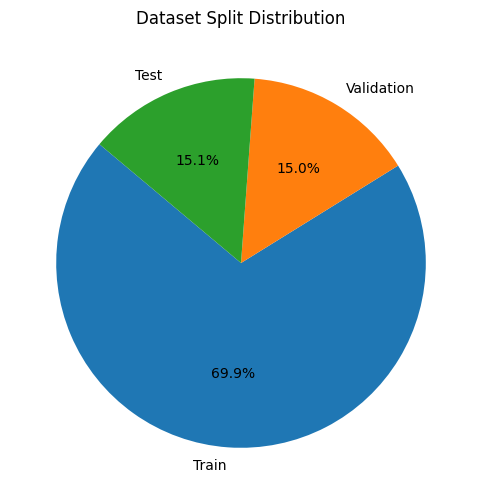

In [ ]:
# Dataset Split Distribution Pie Chart
split_counts = [train_size, val_size, test_size]
split_labels = ["Train", "Validation", "Test"]

plt.figure(figsize=(8, 6))
plt.pie(split_counts, labels=split_labels, autopct="%1.1f%%", startangle=140)
plt.title("Dataset Split Distribution")
plt.show()


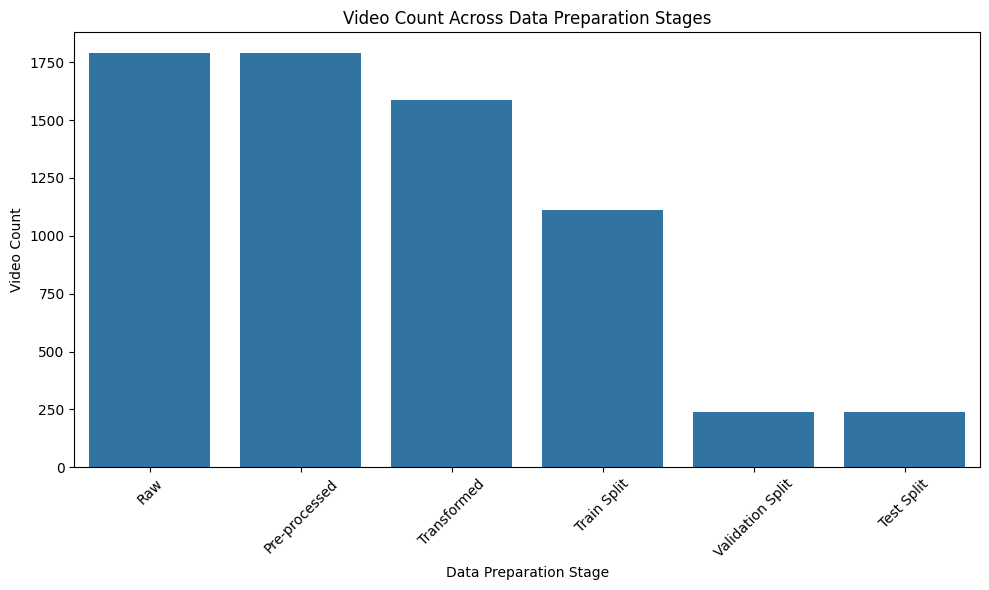

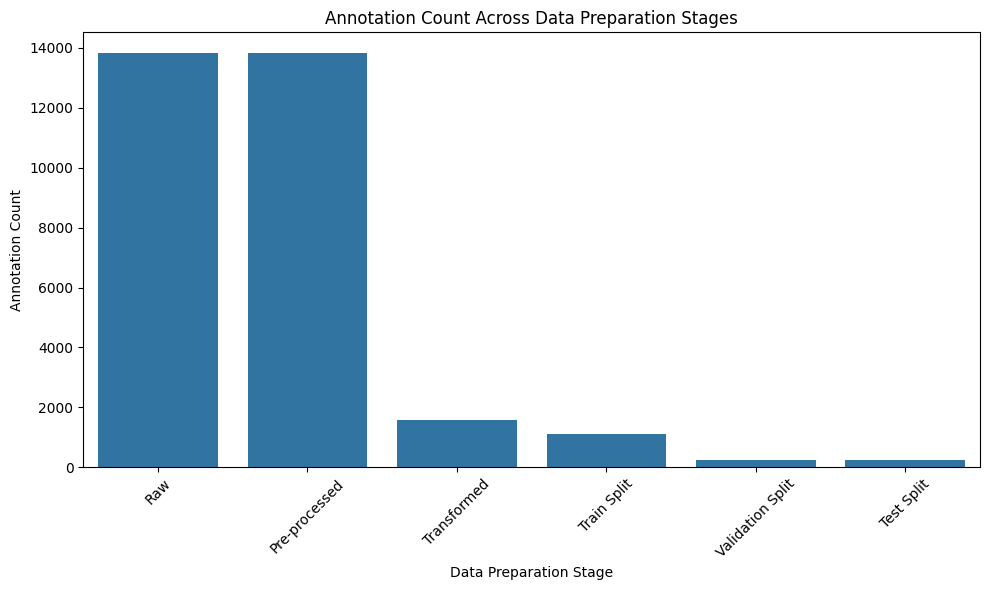

In [ ]:
# Video Count Bar Plot
plt.figure(figsize=(10, 6))
sns.barplot(x="Dataset Stage", y="Video Count", data=summary_df)
plt.title("Video Count Across Data Preparation Stages")
plt.xlabel("Data Preparation Stage")
plt.ylabel("Video Count")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Annotation Count Bar Plot
plt.figure(figsize=(10, 6))
sns.barplot(x="Dataset Stage", y="Annotation Count", data=summary_df)
plt.title("Annotation Count Across Data Preparation Stages")
plt.xlabel("Data Preparation Stage")
plt.ylabel("Annotation Count")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


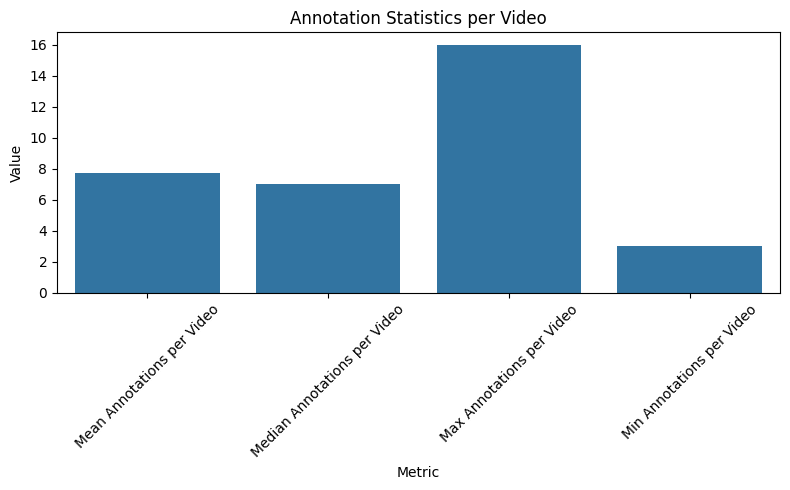

In [ ]:
# Annotation Statistics
annotation_counts = [len(video["annotations"]) for video in transformed_annotations.values() if "annotations" in video]
annotation_stats = {
    "Mean Annotations per Video": sum(annotation_counts) / len(annotation_counts),
    "Median Annotations per Video": pd.Series(annotation_counts).median(),
    "Max Annotations per Video": max(annotation_counts),
    "Min Annotations per Video": min(annotation_counts)
}

annotation_stats_df = pd.DataFrame(list(annotation_stats.items()), columns=["Metric", "Value"])

# Bar Plot for Annotation Statistics
plt.figure(figsize=(8, 5))
sns.barplot(x="Metric", y="Value", data=annotation_stats_df)
plt.title("Annotation Statistics per Video")
plt.xlabel("Metric")
plt.xticks(rotation=45)
plt.ylabel("Value")
plt.tight_layout()
plt.show()
